## Final Project, Milestone 1

### Milestone 1 Goals from the Proposal:

1.	A plotly map of the United States with high schools visualized as points on the map. Individual school data displayed on hover.
2.	A data frame of high school media scraped from the SNO and contest sites.

### Task 1: Get data for all high schools in the country

The National Center for Education Statistics makes [school datasets available](https://data-nces.opendata.arcgis.com/search?groupIds=455147561fd3416daa180395fb4e9237) for download. It also has an API for postsecondary school data but the lower-level school data I'm interested in comes in a CSV. The two datasets I downloaded are:
1. ["Public School Characteristics 2021-22"](https://data-nces.opendata.arcgis.com/maps/b480c30aa8654d23be9b79a0feb436e3). This is the most recent version of this dataset. It contains 101,278 records of K-12 public schools. It includes each school's latitude and longitude, and a column that indicates the school's highest grade, which I will use to filter secondary schools, that is, ones where the highest grade is 10, 11, or 12.
2. ["Private School Locations Current"](https://data-nces.opendata.arcgis.com/maps/1c004a108b18460bba1ddb29ec1f7982). This dataset contains 22,345 records of K-12 private schools. Unfortunately, unlike the public school dataset, there is no way to filter secondary schools in this dataset. So I don't know if I will be using this dataset because many of the schools here aren't relevant to the focus of this project, which are secondary schools.

### Task 2: Select a map renderer

### Plotly and Mapbox

I started with the ["Scatter Plots on Mapbox in Python"](https://plotly.com/python/scattermapbox/) documentation. I followed instructions to get the API key and attempted to render Mapbox maps using the examples provided. However, I kept getting a "Javascript Error: Mapbox error" message without any further clarification. Online forums were not helpful in resolving this. Mapbox seems pretty robust and I'm willing to work with it but it's not an option until I am able to overcome the error.

In [7]:
token = open("mapbox_token.rtf").read()

import pandas as pd
us_cities = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/us-cities-top-1k.csv")

import plotly.express as px

fig = px.scatter_mapbox(us_cities, lat="lat", lon="lon", hover_name="City", hover_data=["State", "Population"],
                        color_discrete_sequence=["fuchsia"], zoom=3, height=300)
fig.update_layout(mapbox_style="light", mapbox_accesstoken=token)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Plotly and USGS

To see how the plotly renderer and location marker features work, I tried an example that uses a USGS map as the base layer. Creating the location markers is seamless using longitude and latitude. But this uses the plotly express approach, so the options for controlling certain display elements are not as robust as I probably will want them to be. 

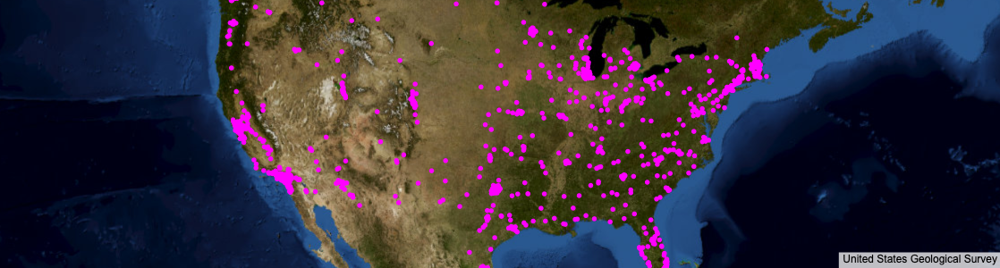

In [6]:
import pandas as pd
us_cities = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/us-cities-top-1k.csv")

import plotly.express as px

fig = px.scatter_mapbox(us_cities, lat="lat", lon="lon", hover_name="City", hover_data=["State", "Population"],
                        color_discrete_sequence=["fuchsia"], zoom=3, height=300)
fig.update_layout(
    mapbox_style="white-bg",
    mapbox_layers=[
        {
            "below": 'traces',
            "sourcetype": "raster",
            "sourceattribution": "United States Geological Survey",
            "source": [
                "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
            ]
        }
      ])
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


### Plotly and go.Scattergeo

Next, I tried a map type that simplifies a US visualization by displaying Alaska and Hawaii where Mexico should be. I used an example from [this documentation page](https://plotly.com/python/scatter-plots-on-maps/). This uses plotly graph objects, so it allows for more customization than express. But the map lacks any state or city labels, which is a downside.

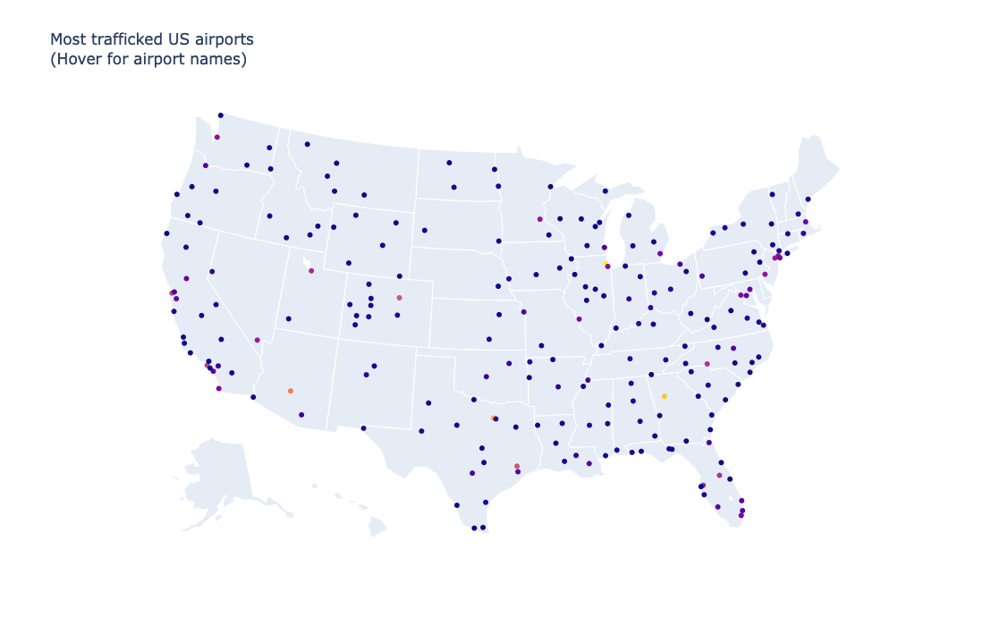

In [70]:
import plotly.graph_objects as go

import pandas as pd

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_february_us_airport_traffic.csv')
df['text'] = df['airport'] + '' + df['city'] + ', ' + df['state'] + '' + 'Arrivals: ' + df['cnt'].astype(str)

fig = go.Figure(data=go.Scattergeo(
        lon = df['long'],
        lat = df['lat'],
        text = df['text'],
        mode = 'markers',
        marker_color = df['cnt'],
        ))

fig.update_layout(
        title = 'Most trafficked US airports<br>(Hover for airport names)',
        geo_scope='usa',
        height = 700
    )
fig.show()


#### Folium

[This YouTube tutorial](https://www.youtube.com/watch?v=H8Ypb8Ei9YA&t=16s) introduced me to Folium. 

An attractive feature this video demonstrates is the **ability to cluster** a large number of map markers into a more manageable number of clusters. A user clicks on the cluster in which they are interested, and the map zooms into that cluster and displays more clusters or the individual markers. (I have learned since that this is also possible in plotly.) 

A less attractive feature of Folium is that rendering map markers requries code that iterates through the dataset. Perhaps this is not a big deal but in comparison to plotly's automatic marker rendering, this approach feels less efficicent. 

I installed Folium:

In [14]:
pip install folium

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.0/100.0 kB 2.0 MB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.0/82.0 kB 2.8 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [1]:
import folium

I used Folium's [Getting Started document](https://python-visualization.github.io/folium/latest/getting_started.html) to try out its maps. 

In [65]:
m = folium.Map(location=(45.5236, -122.6750))
m

In [4]:
folium.Map((45.5236, -122.6750), tiles="cartodb positron")

In [8]:
m = folium.Map([45.35, -121.6972], zoom_start=12)

folium.Marker(
    location=[45.3288, -121.6625],
    tooltip="Click me!",
    popup="Mt. Hood Meadows",
    icon=folium.Icon(icon="cloud"),
).add_to(m)

folium.Marker(
    location=[45.3311, -121.7113],
    tooltip="Click me!",
    popup="Timberline Lodge",
    icon=folium.Icon(color="green"),
).add_to(m)


In [9]:
m

Trying coordinates and zoom level to center the continental US in the window. 

In [22]:
folium.Map((39,-100), tiles="cartodb positron", zoom_start=4.5)

In [23]:
import pandas as pd

### Task 3: Plot schools on the map

First, read in the public schools dataset. I don't know what the "mixed types" warning is about. 

In [83]:
schools = pd.read_csv("Public_School_Characteristics_2021-22.csv")
schools.head()

/var/folders/9l/1gss040s30197fzh4hpvl0xr0000gq/T/ipykernel_2527/796354012.py:1: DtypeWarning:

Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.



,X,Y,OBJECTID,NCESSCH,SURVYEAR,STABR,LEAID,ST_LEAID,LEA_NAME,SCH_NAME,...,HIALF,HI,TRALM,TRALF,TR,WHALM,WHALF,WH,LATCOD,LONCOD
0,-86.206200,34.2602,1,10000500870,2021-2022,AL,100005,AL-101,Albertville City,Albertville Middle School,...,246.0,486.0,22.0,13.0,35.0,182.0,171.0,353.0,34.2602,-86.206200
1,-86.204900,34.2622,2,10000500871,2021-2022,AL,100005,AL-101,Albertville City,Albertville High School,...,424.0,883.0,18.0,17.0,35.0,345.0,335.0,680.0,34.2622,-86.204900
2,-86.220100,34.2733,3,10000500879,2021-2022,AL,100005,AL-101,Albertville City,Albertville Intermediate School,...,258.0,519.0,13.0,13.0,26.0,174.0,164.0,338.0,34.2733,-86.220100
3,-86.221806,34.2527,4,10000500889,2021-2022,AL,100005,AL-101,Albertville City,Albertville Elementary School,...,226.0,499.0,14.0,9.0,23.0,183.0,131.0,314.0,34.2527,-86.221806
4,-86.193300,34.2898,5,10000501616,2021-2022,AL,100005,AL-101,Albertville City,Albertville Kindergarten and PreK,...,134.0,289.0,9.0,9.0,18.0,107.0,116.0,223.0,34.2898,-86.193300


### Plot Option 1: Graph Objects

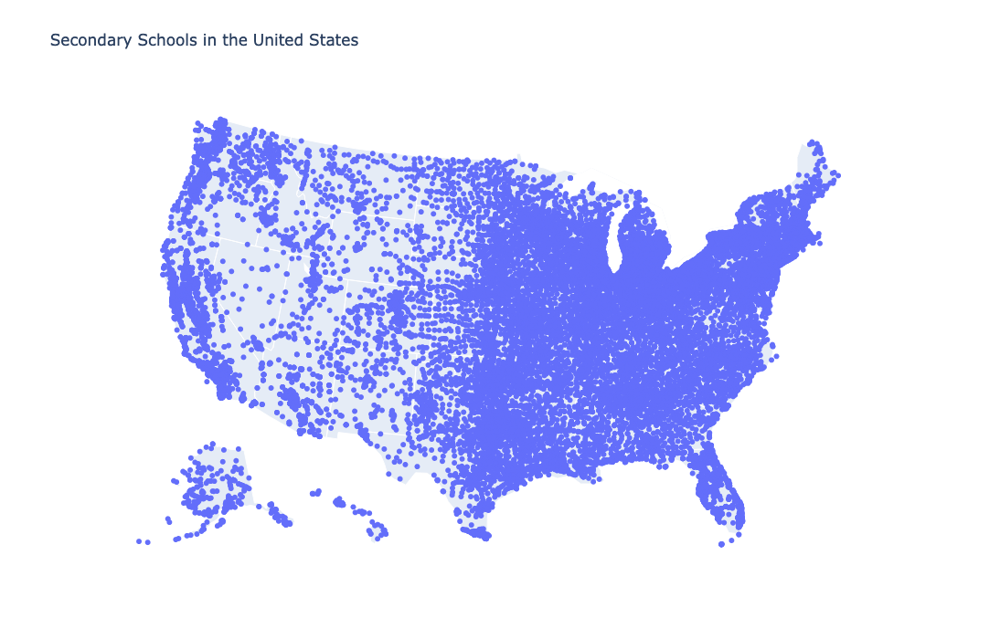

In [89]:
# This filters the secondary schools from the rest of the dataset. I am defining a secondary school as one that ends with grade 10, 11, or 12. 
sec_schools = schools[(schools.GSHI == '10') | (schools.GSHI == '11') | (schools.GSHI == '12')]

fig = go.Figure(data=go.Scattergeo(
        lon = sec_schools['X'],
        lat = sec_schools['Y'],
        text = sec_schools['SCH_NAME'],
        mode = 'markers',
        ))

fig.update_layout(
        title = 'Secondary Schools in the United States',
        geo_scope='usa',
        height = 700
    )
fig.show()

### Plot Option 2: Folium

#### One school plotted using Folium

In [34]:
map = folium.Map((39,-100), tiles="cartodb positron", zoom_start=4.5)

coordinate0 = (schools['Y'][0], schools['X'][0])
folium.Marker(coordinate0).add_to(map)

map

#### All secondary schools plotted using Folium

In [63]:
map = folium.Map((39,-100), tiles="cartodb positron", zoom_start=4.5)

total = 0

for school in schools.index:
    # This if statement filters the secondary schools from the rest of the dataset.
    if schools['GSHI'][school] == '10' or schools['GSHI'][school] == '11' or schools['GSHI'][school] == '12':
        coordinates = (schools['Y'][school], schools['X'][school])
        folium.Marker(coordinates).add_to(map)
        # This is a simple counter to see how many schools are on the map.
        total = total + 1

map

In [64]:
total

28112

Folium clearly is not as efficient as Plotly's scattergeo at visualizing school locations. So I will work on learning how to customize scattergeo for this project.

### Task 4: Constructing a dataset of schools with student media

Student Newspapers Online is the main host of student news websites. It lists [its clients here](https://snosites.com/our-customers/). I hope to one day know how to use Python to scrape this data and arrange it in a dataframe. 

But for now, I copied and pasted into an Excel spreadsheet, used formulas to extract school names and towns into separate columns. I also deleted about 1,000 cases of university and college media, and non-US schools. The original data also incldues URLs to all the media websites but extracting those looked more complex than I could handle for now. I can always go back and pull those out if I decide to provide links on hover.

The resulting dataset has 2,620 observations.

In [90]:
sno_media = pd.read_csv("SNO school media.csv")
sno_media.head()

,Media,School,City,State
0,Acropolis Times,Athens High School,Athens,Alabama
1,Patriot Pages,Bob Jones High School,Madison,Alabama
2,The Hurricane Herald,Brookwood High School,Brookwood,Alabama
3,The Buzz,Chelsea High School,Chelsea,Alabama
4,The Daphne Oracle,Daphne High School,Daphne,Alabama


In [91]:
sno_media.shape

(2620, 4)